In [1]:
%matplotlib inline
%load_ext memory_profiler

import os, sys, glob, re, math, pickle
import phate,scprep,magic,meld
import graphtools as gt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import time,random,datetime
from sklearn import metrics
from sklearn import model_selection
from scipy import sparse
from scipy.stats import mannwhitneyu, tiecorrect, rankdata
from statsmodels.stats.multitest import multipletests
import scanpy as sc
import scvelo as scv
from adjustText import adjust_text
import warnings
from matplotlib import gridspec



# settings
plt.rc('font', size = 9)
plt.rc('font', family='sans serif')
plt.rcParams['pdf.fonttype']=42
plt.rcParams['ps.fonttype']=42
plt.rcParams['text.usetex']=False
plt.rcParams['legend.frameon']=False
plt.rcParams['axes.grid']=False
plt.rcParams['legend.markerscale']=0.5
sc.set_figure_params(dpi=300,dpi_save=600,
                     frameon=False,
                     fontsize=9)
plt.rcParams['savefig.dpi']=600
sc.settings.verbosity=2
sc._settings.ScanpyConfig.n_jobs=-1
sns.set_style("ticks")


In [2]:

# fps
sdfp = '/home/ngr4/project/sccovid/shared/data/processed/'
pfp = '/home/ngr4/project/sccovid/results/'
pdfp = '/home/ngr4/project/sccovid/data/processed/'
sc.settings.figdir = pfp

def loader(fname,fpath,backed=None) : 
    start = time.time()
    adata = sc.read_h5ad(filename=os.path.join(fpath,fname),backed=backed)
    print('loaded @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))
    return adata

def writer(fname,fpath,AnnData) :
    start = time.time()
    AnnData.write(os.path.join(fpath,fname))
    print('saved @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to save data'.format(time.time()-start))
    

if True :
    # load personal
    fname='scv2_200428.h5ad'
    %memit adata = loader(fname,pdfp)

    
# aesthetics
cmap_condition = {v:sns.cubehelix_palette(4,start=.5,rot=-.75)[i] for i,v in enumerate(adata.obs['Condition'].unique())}
cmap_infected = {'Infected':sns.color_palette('muted')[1],
                 'Bystander':sns.color_palette('muted')[0]}
cmap_ctype = {v:sns.color_palette('colorblind')[i] for i,v in enumerate(adata.obs['ctype'].unique())}

loaded @200503.11:11:39
took 40.37-s to load data
peak memory: 36589.30 MiB, increment: 36389.82 MiB


In [160]:
adata.obs.groupby('Condition').mean()

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,pmito,n_genes,scv2+,scv2_5+,scv2_10+,raw,res_inf,ees_inf
Condition,,,,,,,,,,,,,,,,
1dpi,3614.668273,7.928526,15065.593750,9.079881,31.423299,40.631068,50.901540,66.739203,0.086496,3614.668273,0.011920,0.018176,0.012173,25.415421,-0.975653,-0.917847
2dpi,3605.122192,8.013954,13986.463867,9.200578,33.191835,42.316066,51.970177,66.029793,0.085745,3605.122192,0.091491,0.208237,0.097209,109.053848,-0.805582,-0.845545
3dpi,2444.158469,7.662830,7373.647949,8.653246,34.474439,44.332122,54.244439,68.431741,0.090232,2444.158469,0.105879,0.231182,0.111244,54.386742,-0.777513,-0.814224
Mock,2608.243542,7.727489,9478.498047,8.880070,33.518732,44.682154,55.662141,70.323387,0.047447,2608.243542,0.000133,0.000442,0.000133,0.006679,-0.999735,-0.958342


In [84]:
# aesthetics
cmap_condition = {v:sns.cubehelix_palette(4,start=.5,rot=-.75)[i] for i,v in enumerate(adata.obs['Condition'].unique())}
cmap_infected = {'Infected':sns.color_palette('muted')[1],
                 'Bystander':sns.color_palette('muted')[0]}
cmap_ctype = {v:sns.color_palette('colorblind')[i] for i,v in enumerate(adata.obs['ctype'].unique())}

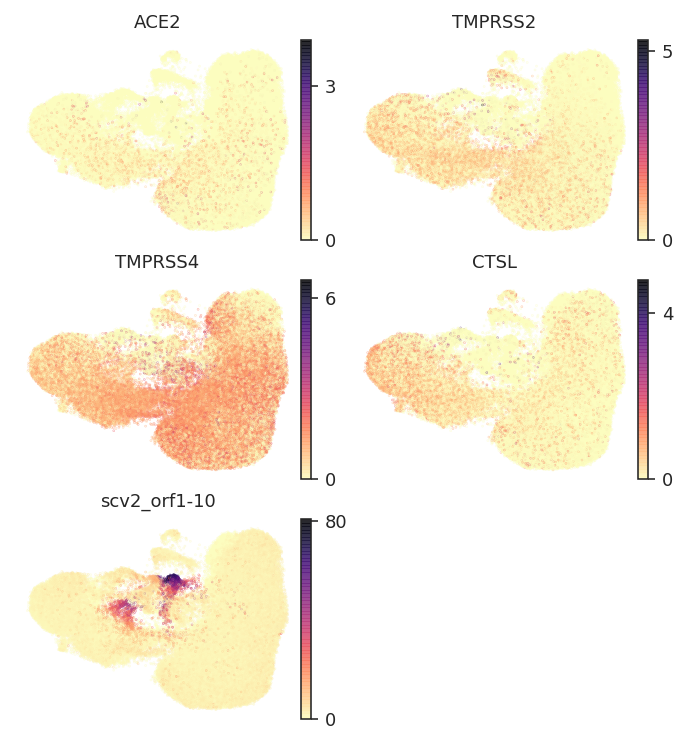

In [23]:
genes = ['ACE2','TMPRSS2','TMPRSS4','CTSL','scv2_orf1-10']

fig = plt.figure(figsize=(6,6))

for i,g in enumerate(genes):
    ax = fig.add_subplot(3,2,i+1)
    color = adata[:,g].X 
    im = ax.scatter(x=adata.obsm['X_umap'][:,0],
                    y=adata.obsm['X_umap'][:,1],
                    c = color, cmap='magma_r',
                    s = 0.05, alpha=0.6,
                    rasterized=True)
    ax.set_title(g)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    cbar = fig.colorbar(im, pad=0, ax=ax,
                        ticks = [np.floor(color.min()), np.floor(color.max())])
    
fig.subplots_adjust(wspace=0)
fig.savefig(os.path.join(pfp,'embed_expression_POI.pdf'),bbox_inches='tight',dpi=300)

In [51]:
adata.obs['raw']=adata.raw[:,'scv2_orf1-10'].X

In [51]:
x.melt(id_vars=['ctype'])

,ctype,Condition,value
0,BC/Club,Mock,0.000657
1,Basal cells,Mock,0.007304
2,Ciliated cells,Mock,0.010496
3,Club cells,Mock,0.002212
4,Goblet cells,Mock,0.000000
5,Ionocytes,Mock,0.000000
6,Neuroendocrine cells,Mock,0.000000
7,Tuft cells,Mock,0.000000
8,BC/Club,1dpi,6.517731
9,Basal cells,1dpi,1.018491


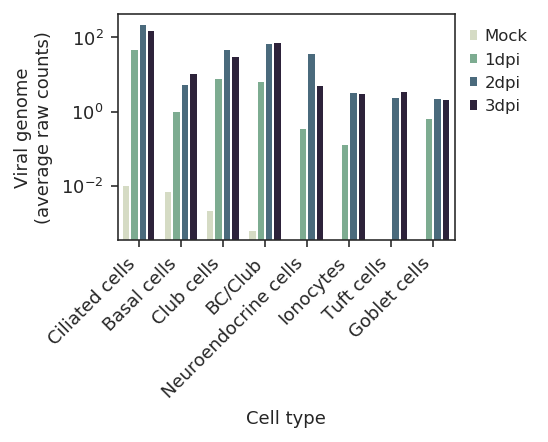

In [182]:
x = adata.obs.groupby(['Condition','ctype']).mean()['raw']
x = x.unstack(level=0)

x = x.loc[:,['Mock','1dpi','2dpi','3dpi']]
x.columns = x.columns.add_categories(['ctype'])
x = x.reset_index()
x = x.melt(id_vars=['ctype'])
fig,ax=plt.subplots(1,1,figsize=(3,2))
sns.barplot(x='ctype',y='value',hue='Condition',
            data=x,
            order = ['Ciliated cells','Basal cells','Club cells','BC/Club','Neuroendocrine cells','Ionocytes','Tuft cells','Goblet cells'],
            palette=cmap_condition)
ax.set_xlabel('Cell type')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
ax.legend(bbox_to_anchor=(1,1))
ax.set_ylabel('Viral genome\n(average raw counts)')
ax.set_yscale('log')
fig.savefig(os.path.join(pfp,'SCV2genomeRawCounts_ctype.pdf'),bbox_inches='tight')

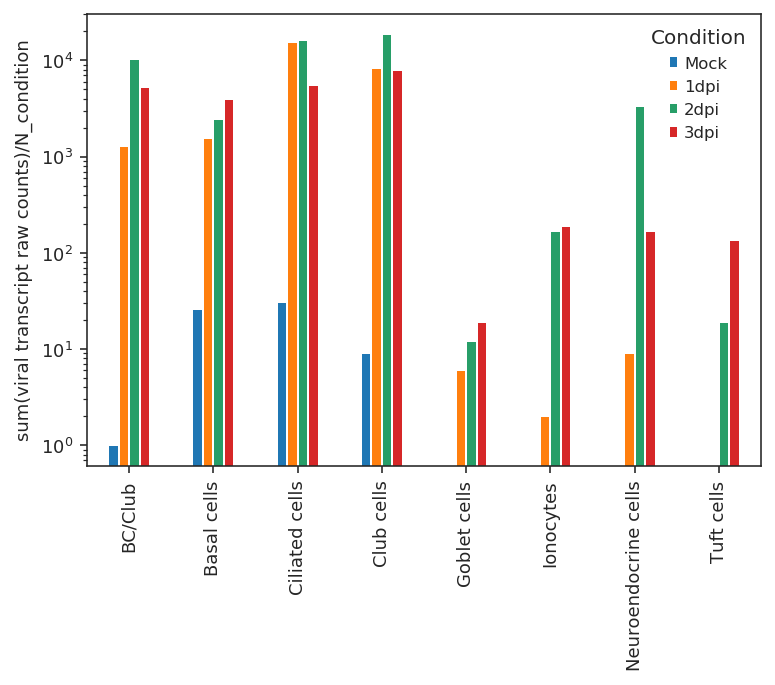

In [63]:
x = adata.obs.groupby(['Condition','ctype']).max()['raw']
x = x.unstack(level=0)

x = x.loc[:,['Mock','1dpi','2dpi','3dpi']]
ax = x.plot(kind='bar')
ax.set_ylabel('sum(viral transcript raw counts)/N_condition')
ax.set_xlabel('')
ax.set_yscale('log')

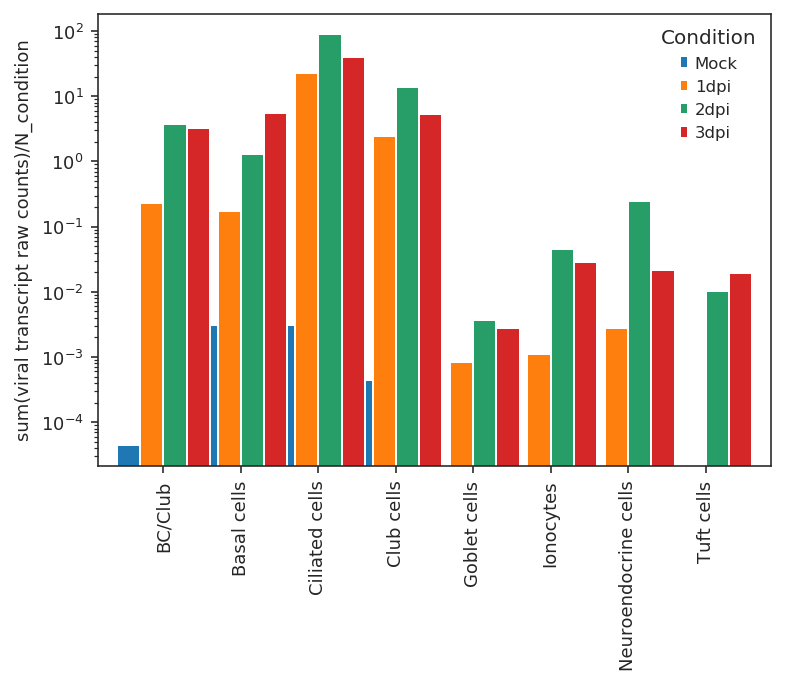

In [65]:
x = adata.obs.groupby(['Condition','ctype']).sum()['raw']/adata.obs.groupby('Condition').count()['batch']
x = x.unstack(level=0)

x = x.loc[:,['Mock','1dpi','2dpi','3dpi']]
ax = x.plot(kind='bar', width=1.2)
ax.set_ylabel('sum(viral transcript raw counts)/N_condition')
ax.set_xlabel('')
ax.set_yscale('log')

Text(0.5, 0, '')

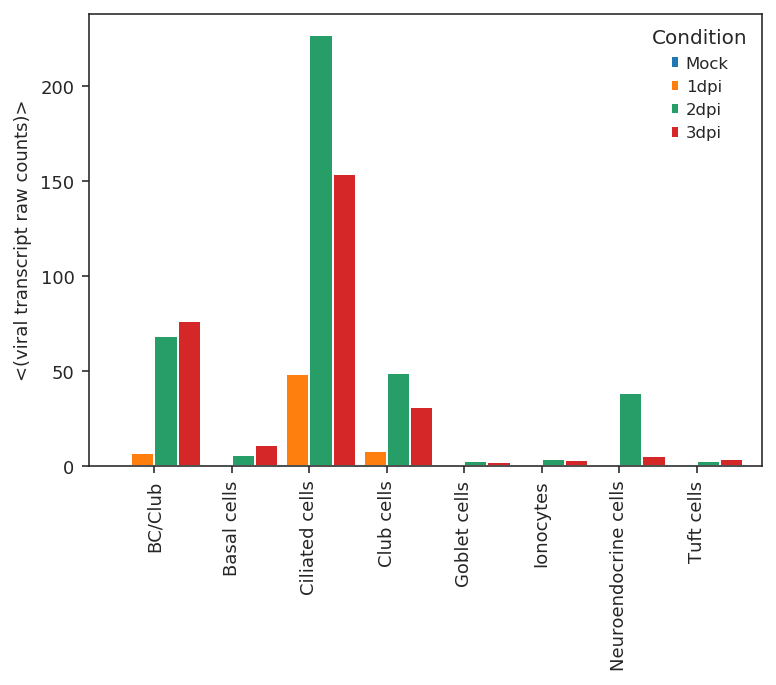

In [27]:
adata.obs['raw'] = adata.raw[:,'scv2_orf1-10'].X
x = adata.obs.groupby(['Condition','ctype']).mean()['raw']
x = x.unstack(level=0)

x = x.loc[:,['Mock','1dpi','2dpi','3dpi']]
ax = x.plot(kind='bar', width=1.2)
ax.set_ylabel('<(viral transcript raw counts)>')
ax.set_xlabel('')
# ax.set_yscale('log')

In [20]:
x = adata.obs.groupby(['ctype','Condition']).count()['batch'].reset_index()
x =x.rename(columns={'batch':'n'})

,ctype,Condition,batch
0,BC/Club,1dpi,423
1,BC/Club,2dpi,812
2,BC/Club,3dpi,1239
3,BC/Club,Mock,1522
4,Basal cells,1dpi,2001
5,Basal cells,2dpi,3501
6,Basal cells,3dpi,14301
7,Basal cells,Mock,9584
8,Ciliated cells,1dpi,5498
9,Ciliated cells,2dpi,5802


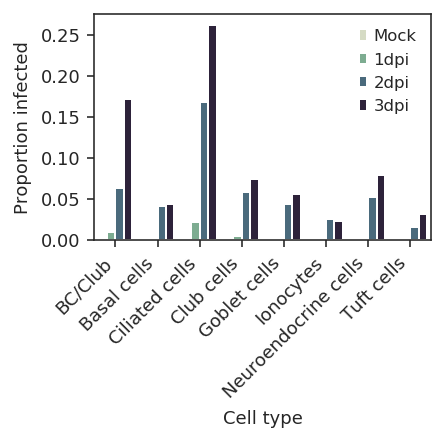

In [71]:
# percent 
x = adata.obs.groupby(['Condition','ctype']).sum()['scv2_10+']/adata.obs.groupby(['Condition','ctype']).count()['batch']
x = x.unstack(level=0)

x = x.loc[:,['Mock','1dpi','2dpi','3dpi']]
x.columns = x.columns.add_categories(['ctype'])
x = x.reset_index()
x = x.melt(id_vars=['ctype'])
fig,ax=plt.subplots(1,1,figsize=(3,2))
sns.barplot(x='ctype',y='value',hue='Condition',
            data=x,
            palette=cmap_condition)
ax.set_xlabel('Cell type')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
ax.legend(bbox_to_anchor=(1,1))
ax.set_ylabel('Proportion infected')
fig.savefig(os.path.join(pfp,'pInfected_ctype.pdf'),bbox_inches='tight')

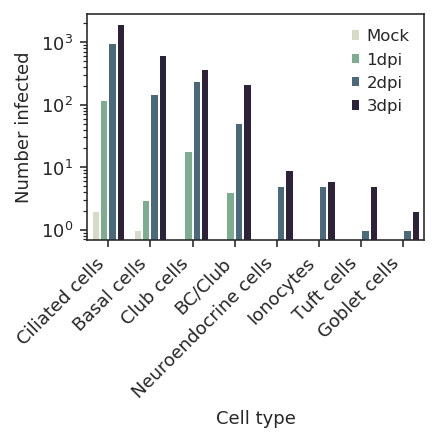

In [183]:
# percent 
x = adata.obs.groupby(['Condition','ctype']).sum()['scv2_10+']
x = x.unstack(level=0)

x = x.loc[:,['Mock','1dpi','2dpi','3dpi']]
x.columns = x.columns.add_categories(['ctype'])
x = x.reset_index()
x = x.melt(id_vars=['ctype'])
fig,ax=plt.subplots(1,1,figsize=(3,2))
sns.barplot(x='ctype',y='value',hue='Condition',
            data=x,
            order = ['Ciliated cells','Basal cells','Club cells','BC/Club','Neuroendocrine cells','Ionocytes','Tuft cells','Goblet cells'],
            palette=cmap_condition)
ax.set_xlabel('Cell type')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
ax.legend(bbox_to_anchor=(1,1))
ax.set_yscale('log')
ax.set_ylabel('Number infected')
fig.savefig(os.path.join(pfp,'nInfected_ctype.pdf'),bbox_inches='tight')

In [10]:
model_name, method = 'CSI','XGB'
s = '{}_{}iter201_X_train.csv'.format(model_name,method)

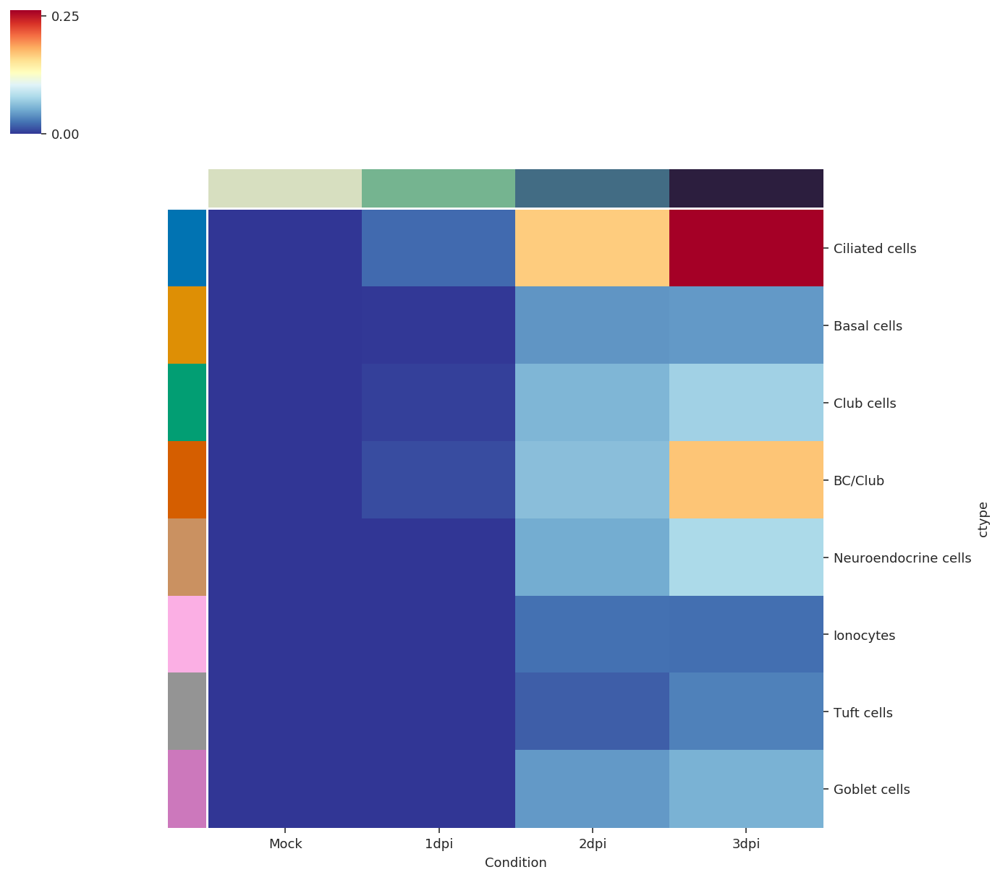

In [3]:
x = adata.obs.groupby(['Condition','ctype']).sum()['scv2_10+']/adata.obs.groupby(['Condition','ctype']).count()['batch']
x = x.unstack(level=0)

x = x.loc[:,['Mock','1dpi','2dpi','3dpi']]
x = x.reindex(['Ciliated cells','Basal cells','Club cells','BC/Club','Neuroendocrine cells','Ionocytes','Tuft cells','Goblet cells'])
# ax = x.plot(kind='bar', width=1.2)
# ax.set_ylabel('Proportion infected')
# ax.set_xlabel('')
# ax.set_title('infected := >={} transcripts'.format(i))

p = sns.clustermap(x,cmap='RdYlBu_r',row_cluster=False, col_cluster=False,
                   col_colors=list(map(cmap_condition.get,['Mock','1dpi','2dpi','3dpi'])),
                   row_colors=list(map(cmap_ctype.get,x.index.to_list())),cbar_kws={'ticks':[0,0.25]})
p.savefig(os.path.join(pfp,'pInfected_ctype_heatmap.pdf'),bbox_inches='tight')

## MELD 

In [105]:
# meld
adata.obs['res_inf'] = adata.obs['scv2_10+']
adata.obs['res_inf'][adata.obs['scv2_10+']==0]=-1

G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),
                 precomputed='adjacency',
                 use_pygsp=True)
G.knn_max = None
adata.obs['ees_inf']=meld.MELD().fit_transform(G=G,RES=adata.obs['res_inf'].to_numpy(dtype=float))
# DO NOT mean center
# adata.obs['ees_inf']=adata.obs['ees_inf']-adata.obs['ees_inf'].mean() # mean center

In [177]:
x = pd.DataFrame({'Infection score':adata.obs['ees_inf'],
                  'SCV2':adata[:,'scv2_orf1-10'].X,
                  'ACE2':adata[:,'ACE2'].X,
                  'TMPRSS2':adata[:,'TMPRSS2'].X,
                  'TMRPSS4':adata[:,'TMPRSS4'].X,
                  'CTSL':adata[:,'CTSL'].X,
                  'ctype':adata.obs['ctype'],
                  'Condition':adata.obs['Condition']})

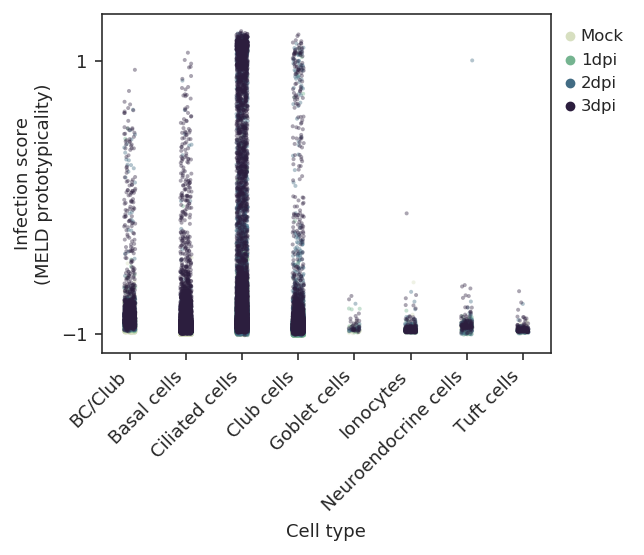

In [138]:
# TO DO, add summary metrics 
fig,ax = plt.subplots(1,1,figsize=(4,3))
p = sns.stripplot(x='ctype',y='Infection score',data=x,
                  hue='Condition', palette=cmap_condition, ax=ax,
                  hue_order=['Mock','1dpi','2dpi','3dpi'],
                  s=2, rasterized=True, alpha=0.4)
ax.set_ylabel('Infection score\n(MELD prototypicality)')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,ha='right')
ax.set_xlabel('Cell type')
ax.set_yticks([-1,1])
ax.legend(bbox_to_anchor=(1,1))
fig.savefig(os.path.join(pfp,'meld_inf_ctype.pdf'),bbox_inches='tight',dpi=300)

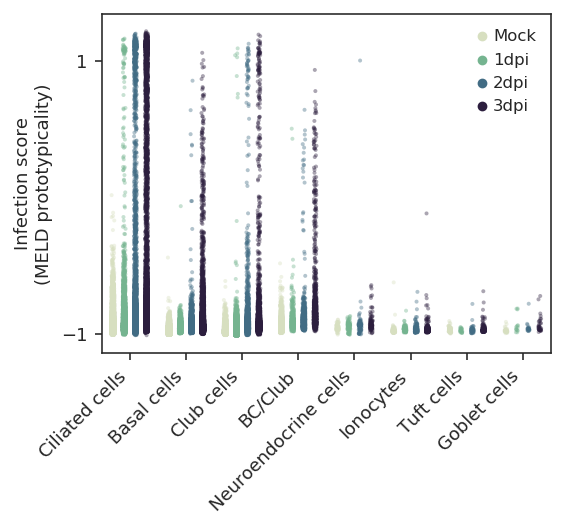

In [180]:
# TO DO, add summary metrics 
fig,ax = plt.subplots(1,1,figsize=(4,3))
p = sns.stripplot(x='ctype',y='Infection score',data=x,
                  hue='Condition', palette=cmap_condition, ax=ax,
                  order = ['Ciliated cells','Basal cells','Club cells','BC/Club','Neuroendocrine cells','Ionocytes','Tuft cells','Goblet cells'],
                  hue_order=['Mock','1dpi','2dpi','3dpi'],
                  dodge=True,
                  s=2, rasterized=True, alpha=0.4)
ax.set_ylabel('Infection score\n(MELD prototypicality)')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,ha='right')
ax.set_xlabel('')
ax.set_yticks([-1,1])
ax.legend(bbox_to_anchor=(1,1))
fig.savefig(os.path.join(pfp,'meld_inf_ctype_dodge.pdf'),bbox_inches='tight',dpi=300)

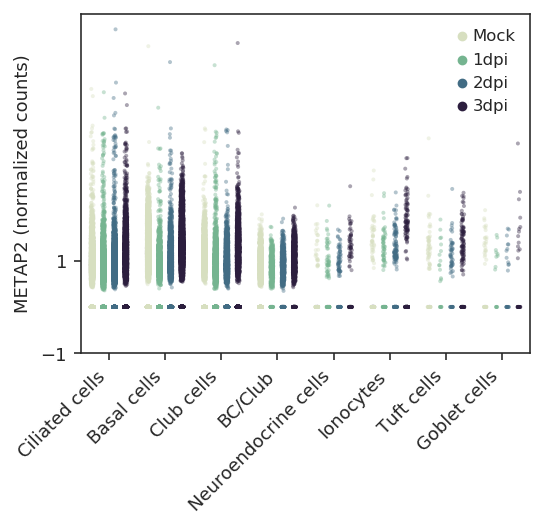

In [ ]:
# check for hyung
x = pd.DataFrame({'Infection score':adata.obs['ees_inf'],
                  'SCV2':adata[:,'scv2_orf1-10'].X,
                  'ACE2':adata[:,'ACE2'].X,
                  'METAP2':adata[:,'METAP2'].X,
                  'ctype':adata.obs['ctype'],
                  'Condition':adata.obs['Condition']})

# TO DO, add summary metrics 
fig,ax = plt.subplots(1,1,figsize=(4,3))
p = sns.stripplot(x='ctype',y='METAP2',data=x,
                  hue='Condition', palette=cmap_condition, ax=ax,
                  order = ['Ciliated cells','Basal cells','Club cells','BC/Club','Neuroendocrine cells','Ionocytes','Tuft cells','Goblet cells'],
                  hue_order=['Mock','1dpi','2dpi','3dpi'],
                  dodge=True,
                  s=2, rasterized=True, alpha=0.4)
ax.set_ylabel('METAP2 (normalized counts)')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,ha='right')
ax.set_xlabel('')
ax.set_yticks([-1,1])
ax.legend(bbox_to_anchor=(1,1))

genes = ['ACE2','TMPRSS2','TMPRSS4','CTSL','scv2_orf1-10','METAP2']

fig = plt.figure(figsize=(6,6))

for i,g in enumerate(genes):
    ax = fig.add_subplot(3,2,i+1)
    color = adata[:,g].X 
    im = ax.scatter(x=adata.obsm['X_umap'][:,0],
                    y=adata.obsm['X_umap'][:,1],
                    c = color, cmap='magma_r',
                    s = 0.05, alpha=0.6,
                    rasterized=True)
    ax.set_title(g)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    cbar = fig.colorbar(im, pad=0, ax=ax,
                        ticks = [np.floor(color.min()), np.floor(color.max())])
    
fig.subplots_adjust(wspace=0)

In [144]:
x = pd.DataFrame({'Infection score':adata.obs['ees_inf'],
                  'Infected':adata.obs['scv2_10+'].map({1:'Infected population',0:'Bystander'}),
                  'SCV2':adata[:,'scv2_orf1-10'].X,
                  'ACE2':adata[:,'ACE2'].X,
                  'TMPRSS2':adata[:,'TMPRSS2'].X,
                  'TMRPSS4':adata[:,'TMPRSS4'].X,
                  'CSTL':adata[:,'CTSL'].X,
                  'ctype':adata.obs['ctype'],
                  'Condition':adata.obs['Condition']})

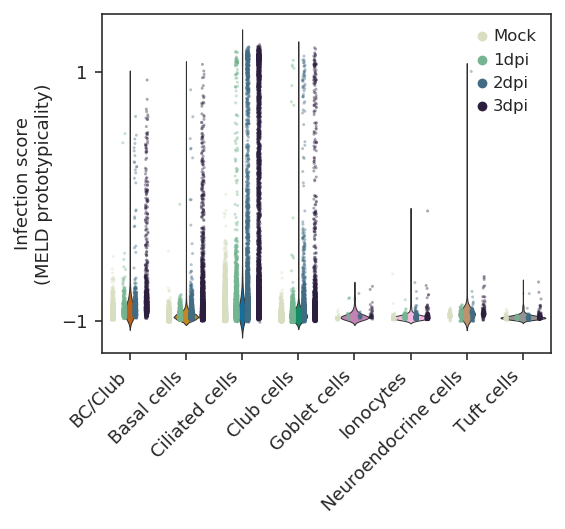

In [148]:
# TO DO, add summary metrics 
fig,ax = plt.subplots(1,1,figsize=(4,3))
p = sns.stripplot(x='ctype',y='Infection score',data=x,
                  hue='Condition', palette=cmap_condition, ax=ax,
                  hue_order=['Mock','1dpi','2dpi','3dpi'],
                  dodge=True,
                  s=1.5, rasterized=True, alpha=0.4)
p2 = sns.violinplot(x='ctype',y='Infection score',data=x,
                    ax=ax, inner = None, linewidth=0.5,
                    palette=cmap_ctype)
ax.set_ylabel('Infection score\n(MELD prototypicality)')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,ha='right')
ax.set_xlabel('')
ax.set_yticks([-1,1])
ax.legend(bbox_to_anchor=(1,1))
fig.savefig(os.path.join(pfp,'meld_inf_ctype_violin.pdf'),bbox_inches='tight',dpi=300)

No handles with labels found to put in legend.


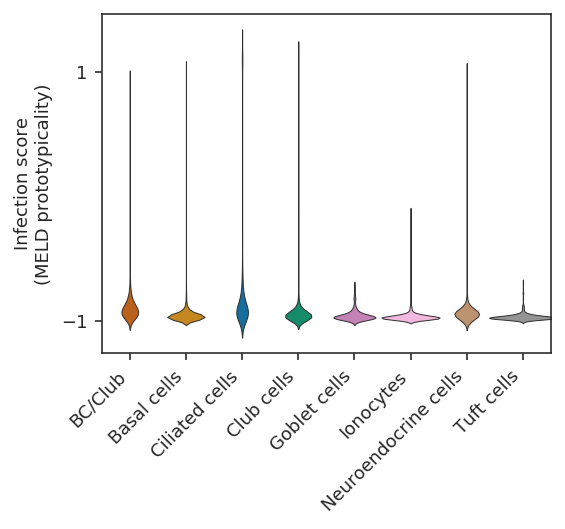

In [151]:
# TO DO, add summary metrics 
fig,ax = plt.subplots(1,1,figsize=(4,3))
# p = sns.stripplot(x='ctype',y='Infection score',data=x,
#                   hue='Condition', palette=cmap_condition, ax=ax,
#                   hue_order=['Mock','1dpi','2dpi','3dpi'],
#                   dodge=True,
#                   s=1.5, rasterized=True, alpha=0.4)
p2 = sns.violinplot(x='ctype',y='Infection score',data=x,
                    ax=ax, inner = None, linewidth=0.5,
                    palette=cmap_ctype, width=1.2)
ax.set_ylabel('Infection score\n(MELD prototypicality)')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,ha='right')
ax.set_xlabel('')
ax.set_yticks([-1,1])
ax.legend(bbox_to_anchor=(1,1))
fig.savefig(os.path.join(pfp,'meld_inf_ctype_violinONLY.pdf'),bbox_inches='tight',dpi=300)

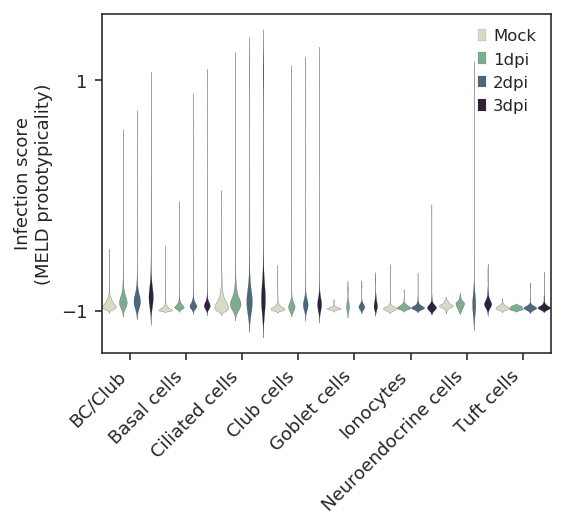

In [156]:
# TO DO, add summary metrics 
fig,ax = plt.subplots(1,1,figsize=(4,3))
# p = sns.stripplot(x='ctype',y='Infection score',data=x,
#                   hue='Condition', palette=cmap_condition, ax=ax,
#                   hue_order=['Mock','1dpi','2dpi','3dpi'],
#                   dodge=True,
#                   s=1.5, rasterized=True, alpha=0.4)
p2 = sns.violinplot(x='ctype',y='Infection score',data=x,
                    hue='Condition', hue_order=['Mock','1dpi','2dpi','3dpi'],
                    ax=ax, inner = None, linewidth=0.1,
                    palette=cmap_condition, width=0.99)
ax.set_ylabel('Infection score\n(MELD prototypicality)')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,ha='right')
ax.set_xlabel('')
ax.set_yticks([-1,1])
ax.legend(bbox_to_anchor=(1,1))
fig.savefig(os.path.join(pfp,'meld_inf_ctype_violinONLYmock.pdf'),bbox_inches='tight',dpi=300)

In [ ]:
# TO DO, add summary metrics 
fig,ax = plt.subplots(1,1,figsize=(4,3))
# p = sns.stripplot(x='ctype',y='Infection score',data=x,
#                   hue='Condition', palette=cmap_condition, ax=ax,
#                   hue_order=['Mock','1dpi','2dpi','3dpi'],
#                   s=2, rasterized=True, alpha=0.1)
p2 = sns.violinplot(x='ctype',y='Infection score',data=x,
                    ax=ax, inner = None, linewidth=0.1,
                    palette=cmap_ctype)
ax.set_ylabel('Infection score\n(MELD prototypicality)')
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,ha='right')
ax.set_xlabel('')
ax.set_yticks([-1,1])
ax.legend(bbox_to_anchor=(1,1))
fig.savefig(os.path.join(pfp,'meld_inf_ctype_violin.pdf'),bbox_inches='tight',dpi=300)

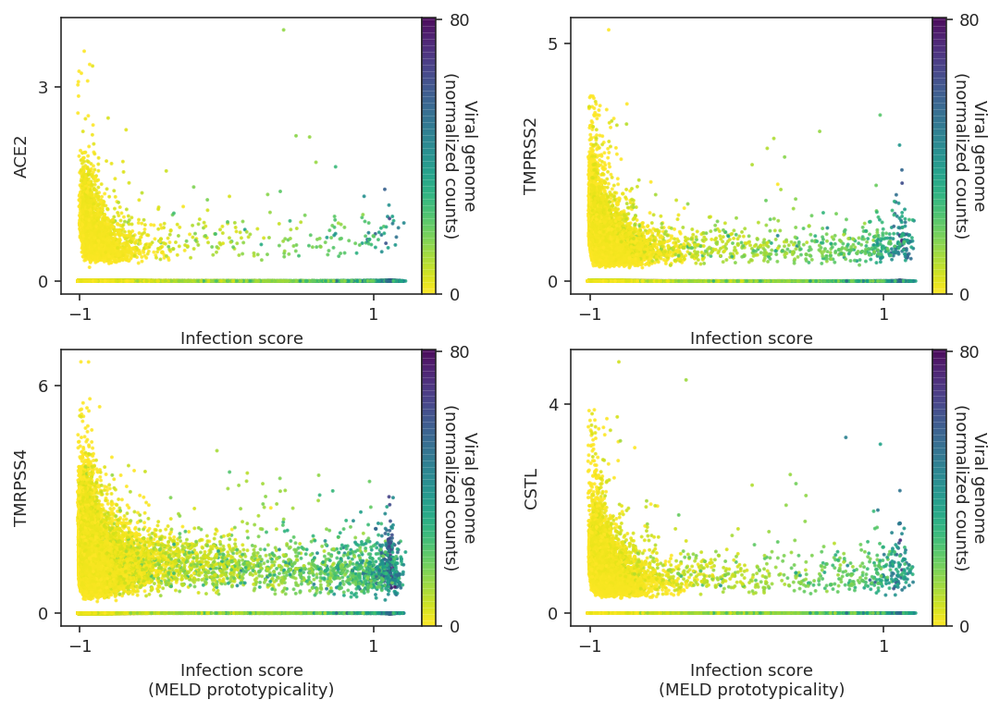

In [129]:
# biaxial plots

# LSN+sqrt
x = pd.DataFrame({'Infection score':adata.obs['ees_inf'],
                  'SCV2':adata[:,'scv2_orf1-10'].X,
                  'ACE2':adata[:,'ACE2'].X,
                  'TMPRSS2':adata[:,'TMPRSS2'].X,
                  'TMRPSS4':adata[:,'TMPRSS4'].X,
                  'CSTL':adata[:,'CTSL'].X,
                  'ctype':adata.obs['ctype'],
                  'Condition':adata.obs['Condition']})

genes = ['ACE2','TMPRSS2','TMRPSS4','CSTL']
fig = plt.figure(figsize=(9,9))
for i,g in enumerate(genes):
    ax = fig.add_subplot(3,2,i+1)
    color = x['SCV2']
    im = ax.scatter(x=x['Infection score'],
                    y=x[g],
                    c = color, cmap='viridis_r',
                    s = 1, alpha=0.8,
                    rasterized=True)
    # ax.spines['right'].set_visible(False)
    # ax.spines['top'].set_visible(False)
    # ax.spines['bottom'].set_visible(False)
    # ax.spines['left'].set_visible(False)
    ax.set_xlabel('Infection score\n(MELD prototypicality)')
    ax.set_ylabel(g)
    ax.set_yticks([np.floor(x[g].min()), np.floor(x[g].max())])
    ax.set_xticks([-1,1])
    cbar = fig.colorbar(im, pad=0, ax=ax,
                        ticks = [np.floor(color.min()), np.floor(color.max())])
    cbar.set_label('Viral genome\n(normalized counts)', rotation=270)
    


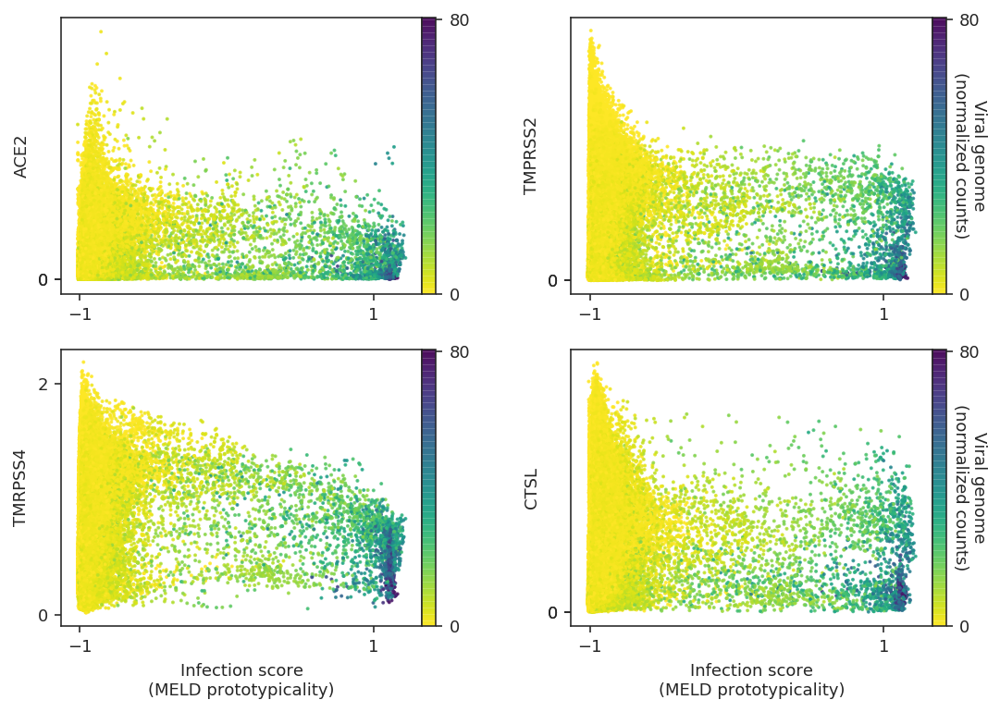

In [163]:
# biaxial plots

# imputed
x = pd.DataFrame({'Infection score':adata.obs['ees_inf'],
                  'SCV2':adata[:,'scv2_orf1-10'].X,
                  'ACE2':adata[:,'ACE2'].layers['imputed_bbknn'],
                  'TMPRSS2':adata[:,'TMPRSS2'].layers['imputed_bbknn'],
                  'TMRPSS4':adata[:,'TMPRSS4'].layers['imputed_bbknn'],
                  'CTSL':adata[:,'CTSL'].layers['imputed_bbknn'],
                  'ctype':adata.obs['ctype'],
                  'Condition':adata.obs['Condition']})

genes = ['ACE2','TMPRSS2','TMRPSS4','CTSL']
fig = plt.figure(figsize=(9,9))
for i,g in enumerate(genes):
    ax = fig.add_subplot(3,2,i+1)
    color = x['SCV2']
    im = ax.scatter(x=x['Infection score'],
                    y=x[g],
                    c = color, cmap='viridis_r',
                    s = 1, alpha=0.8,
                    rasterized=True)
    if i==0 or i==1:
        ax.set_xlabel('')
    else:
        ax.set_xlabel('Infection score\n(MELD prototypicality)')
    ax.set_ylabel(g)
    ax.set_yticks([np.floor(x[g].min()), np.floor(x[g].max())])
    ax.set_xticks([-1,1])
    cbar = fig.colorbar(im, pad=0, ax=ax,
                        ticks = [np.floor(color.min()), np.floor(color.max())])
    if i==1 or i==3:
        cbar.set_label('Viral genome\n(normalized counts)', rotation=270)
    
fig.savefig(os.path.join(pfp,'meld_biaxial_POI.pdf'), bbox_inches='tight', dpi=300)

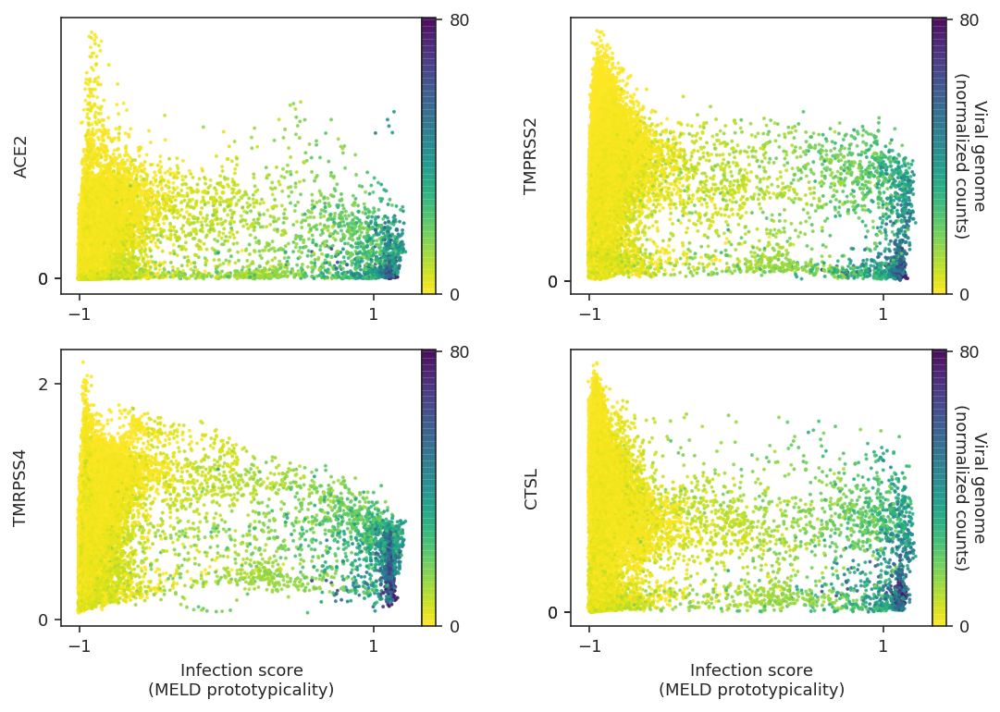

In [173]:
# biaxial plots

# imputed
x = pd.DataFrame({'Infection score':adata.obs['ees_inf'],
                  'SCV2':adata[:,'scv2_orf1-10'].X,
                  'ACE2':adata[:,'ACE2'].layers['imputed_bbknn'],
                  'TMPRSS2':adata[:,'TMPRSS2'].layers['imputed_bbknn'],
                  'TMRPSS4':adata[:,'TMPRSS4'].layers['imputed_bbknn'],
                  'CTSL':adata[:,'CTSL'].layers['imputed_bbknn'],
                  'ctype':adata.obs['ctype'],
                  'Condition':adata.obs['Condition']})

# filter for ciliated
x = x.loc[x['ctype']=='Ciliated cells',:]

genes = ['ACE2','TMPRSS2','TMRPSS4','CTSL']
fig = plt.figure(figsize=(9,9))
for i,g in enumerate(genes):
    ax = fig.add_subplot(3,2,i+1)
    color = x['SCV2']
    im = ax.scatter(x=x['Infection score'],
                    y=x[g],
                    c = color, cmap='viridis_r',
                    s = 1, alpha=0.8,
                    rasterized=True)
    if i==0 or i==1:
        ax.set_xlabel('')
    else:
        ax.set_xlabel('Infection score\n(MELD prototypicality)')
    ax.set_ylabel(g)
    ax.set_yticks([np.floor(x[g].min()), np.floor(x[g].max())])
    ax.set_xticks([-1,1])
    cbar = fig.colorbar(im, pad=0, ax=ax,
                        ticks = [np.floor(color.min()), np.floor(color.max())])
    if i==1 or i==3:
        cbar.set_label('Viral genome\n(normalized counts)', rotation=270)
    
fig.savefig(os.path.join(pfp,'meld_biaxial_POI_CiliatedCells.pdf'), bbox_inches='tight', dpi=300)

## dev

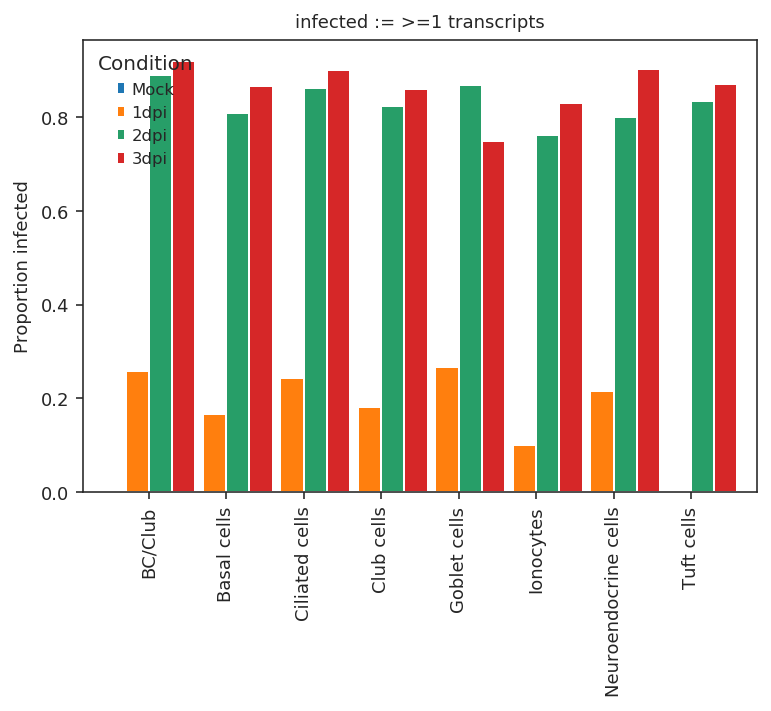

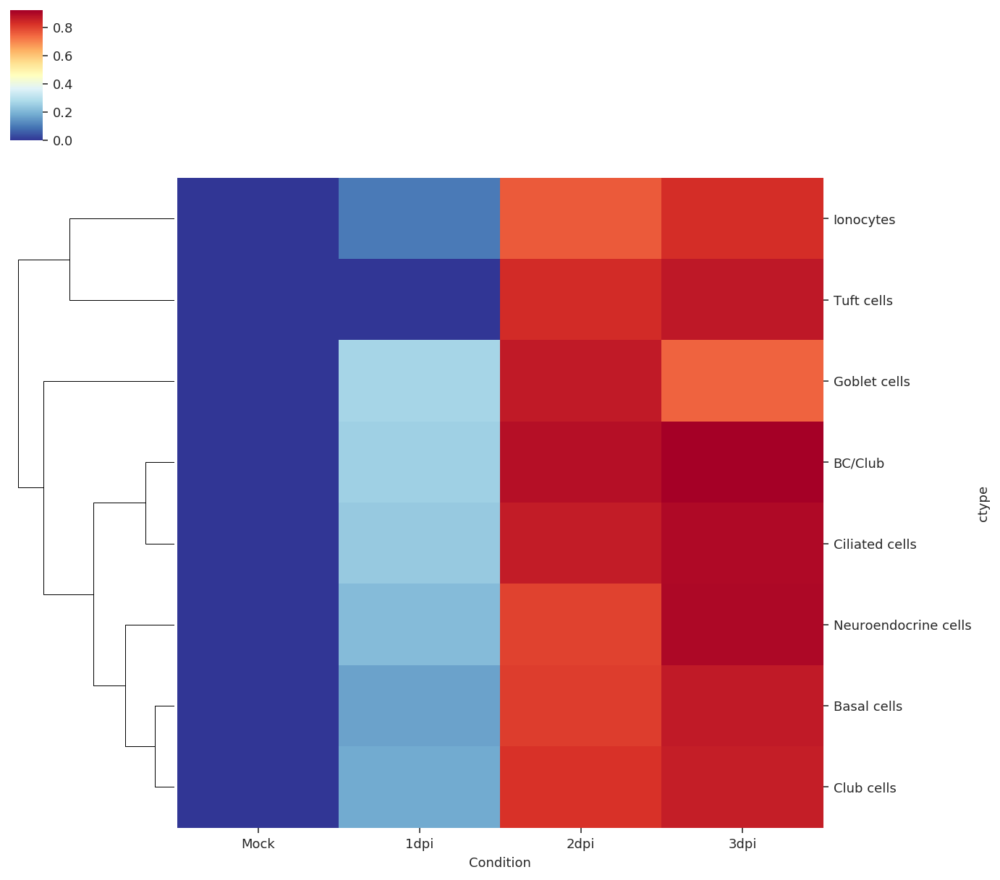

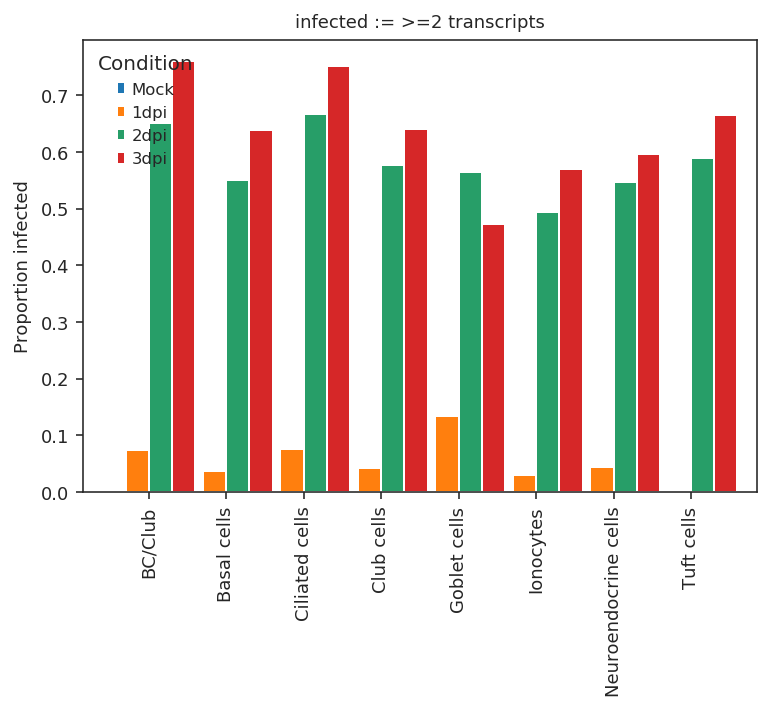

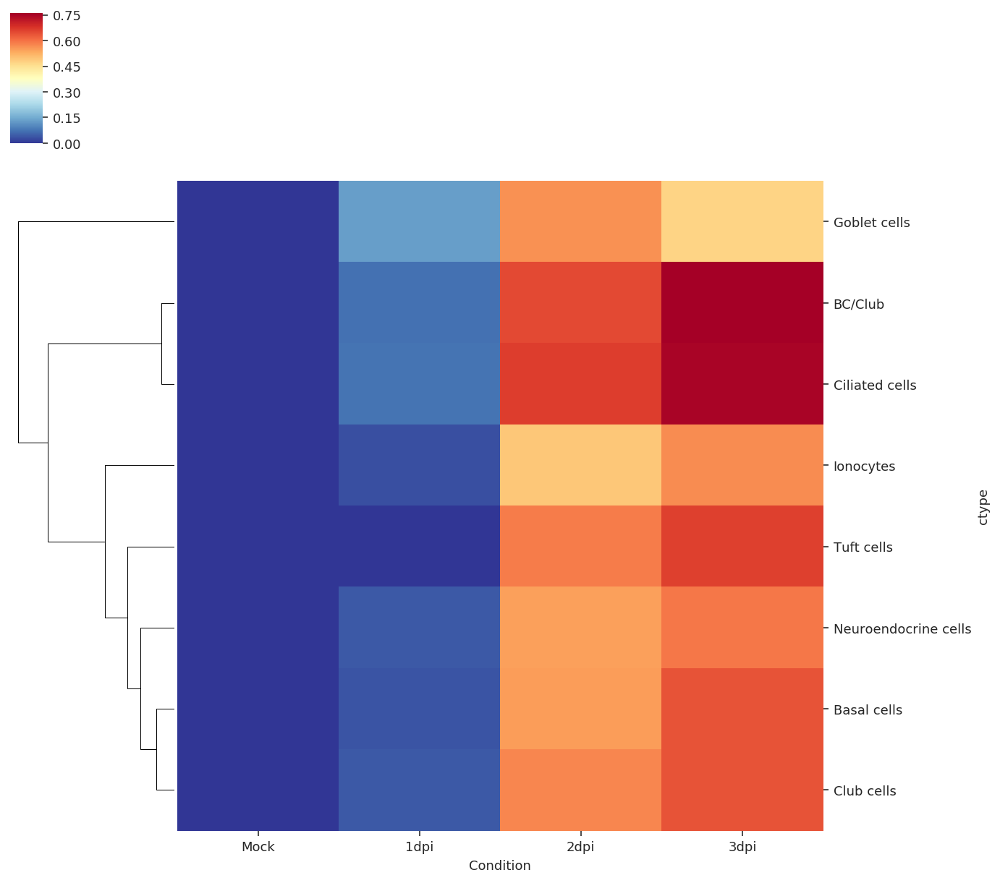

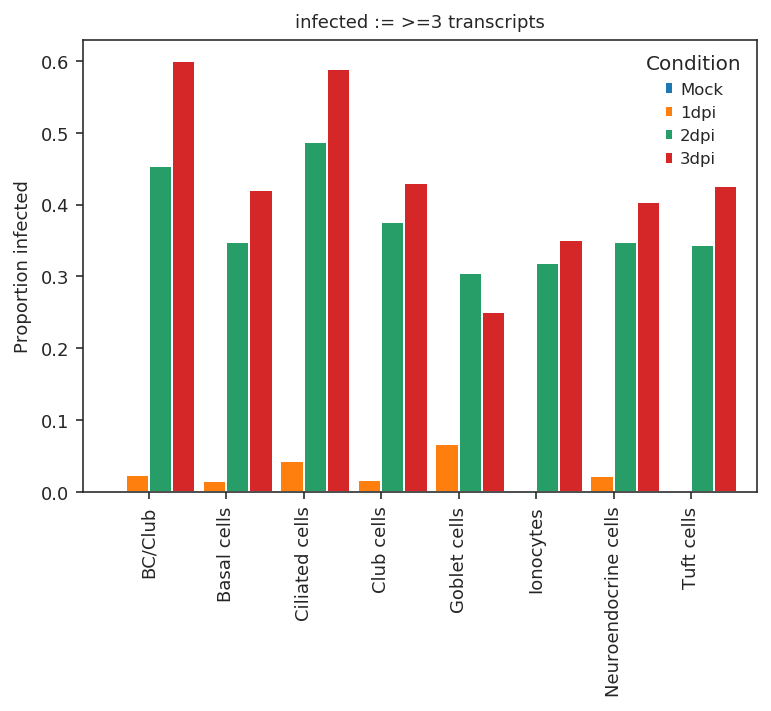

...

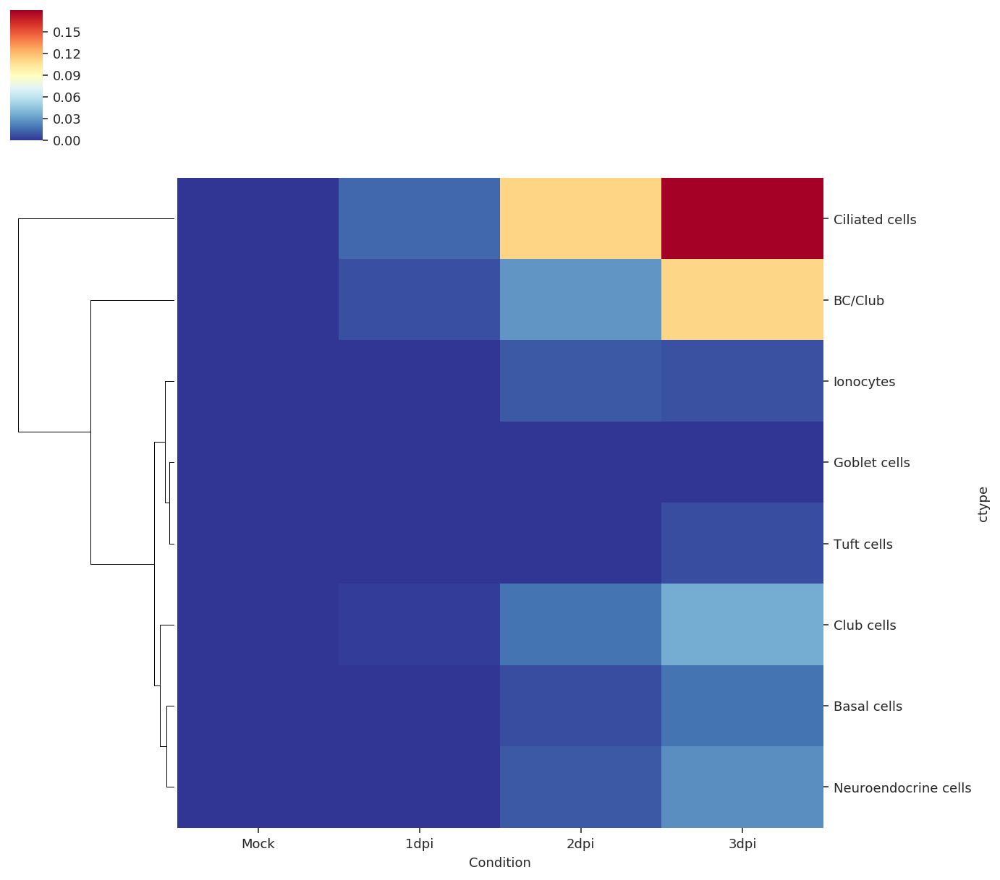

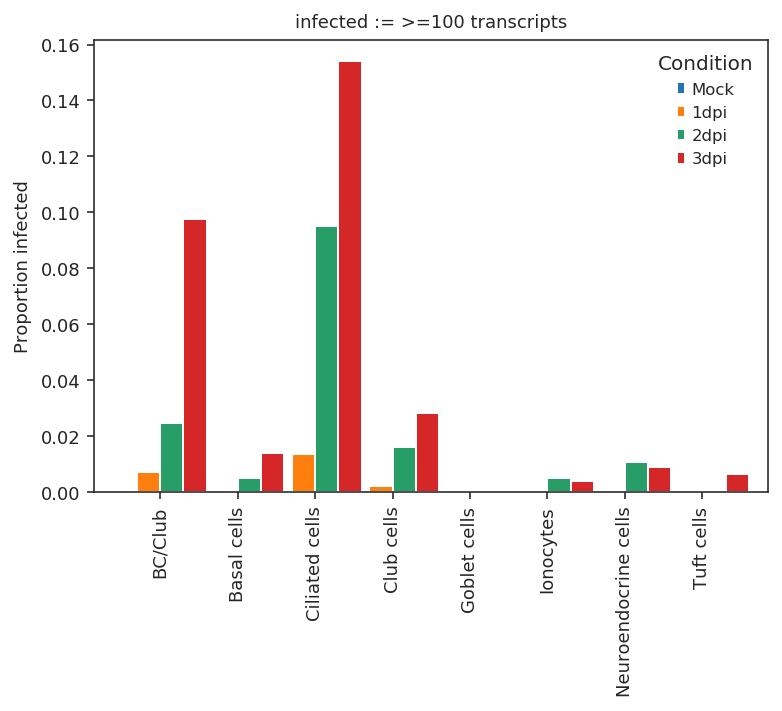

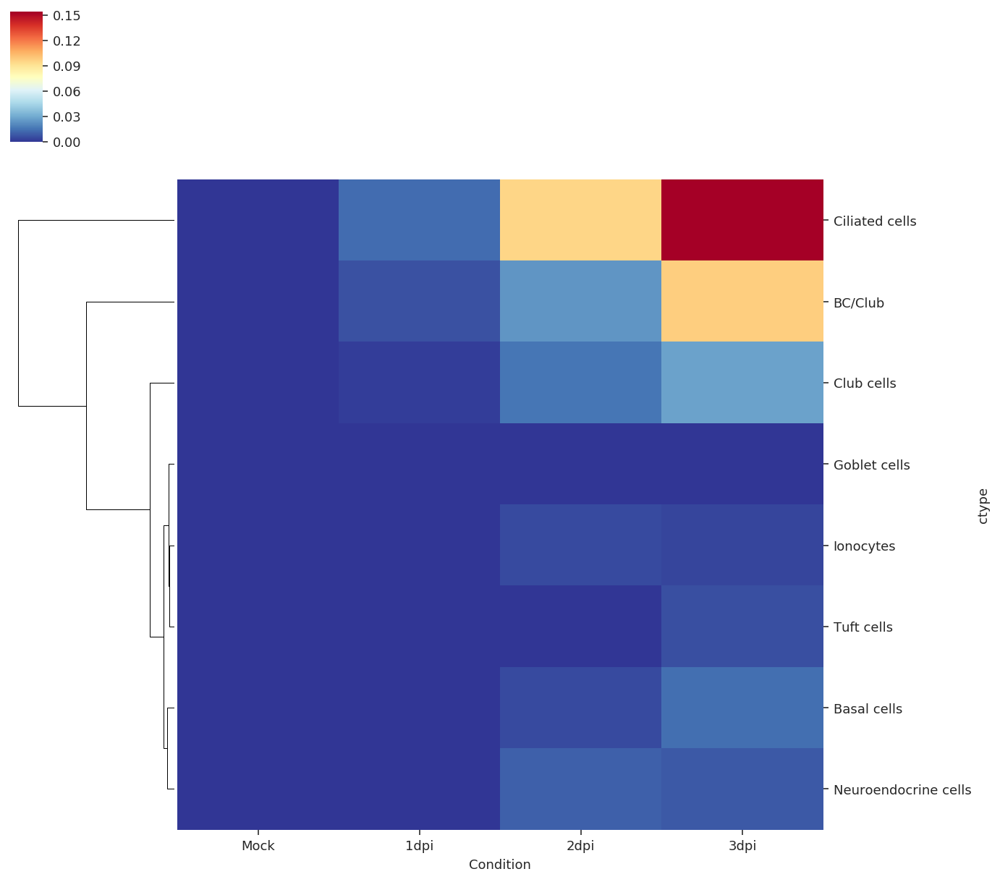

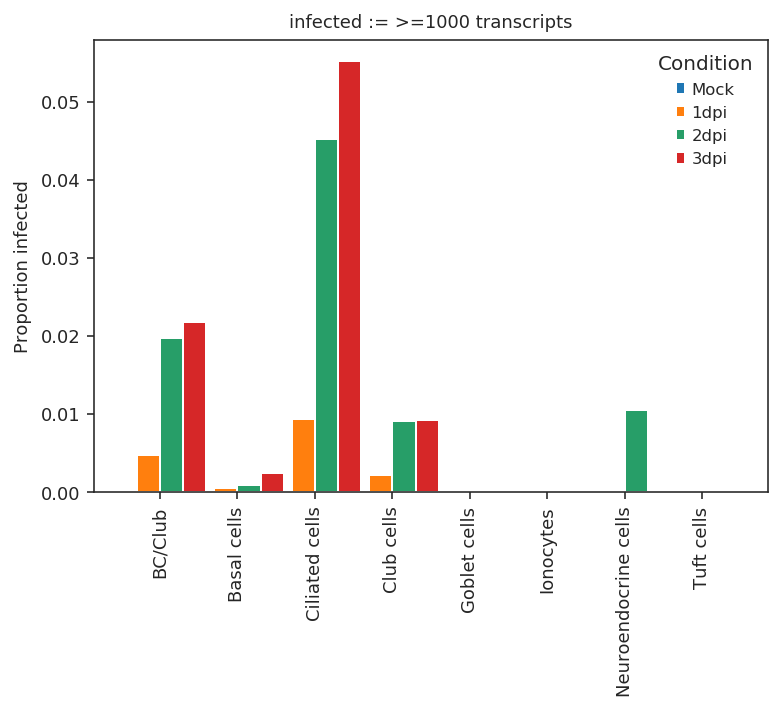

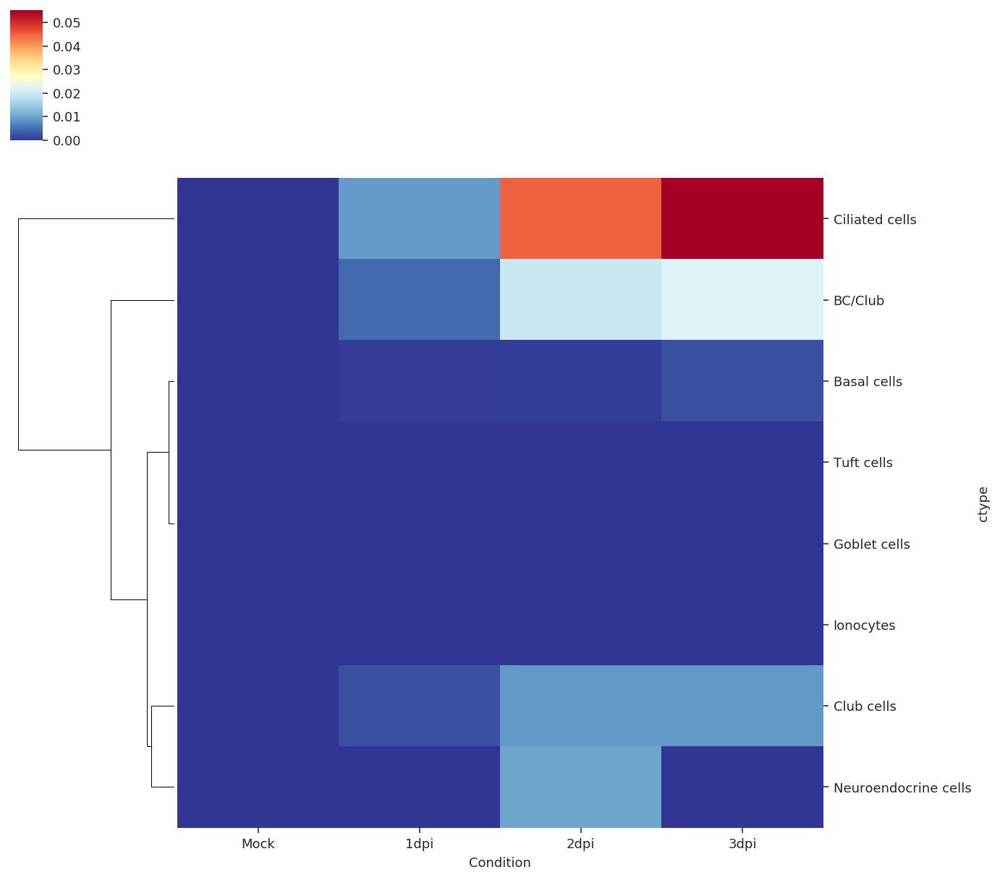

In [37]:
for i in [1,2,3,4,5,6,7,8,9,10,20,25,50, 100, 1000]:
    adata.obs['scv2_+'] = (adata.raw[:,'scv2_orf1-10'].X>=i).astype(int)
    x = adata.obs.groupby(['Condition','ctype']).sum()['scv2_+']/adata.obs.groupby(['Condition','ctype']).count()['batch']
    x = x.unstack(level=0)

    x = x.loc[:,['Mock','1dpi','2dpi','3dpi']]
    ax = x.plot(kind='bar', width=1.2)
    ax.set_ylabel('Proportion infected')
    ax.set_xlabel('')
    ax.set_title('infected := >={} transcripts'.format(i))
    
    sns.clustermap(x,cmap='RdYlBu_r',row_cluster=True, col_cluster=False)

In [12]:
g = 'ACE2'
X = pd.DataFrame({g:adata[:,g].layers['imputed_bbknn'],
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype']})

In [31]:
g = 'ACE2'
X = pd.DataFrame({g:adata[:,g].X,
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype']})

In [ ]:
g = 'ACE2'
X = pd.DataFrame({g:adata[:,g].X,
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype']})

fig, ax = plt.subplots(1,1,figsize=(3,2))
sns.stripplot(x='Condition', y=g, hue='Infected', 
              data=X, order=['Mock','1dpi','2dpi','3dpi'], 
              hue_order=None, 
              jitter=True, dodge=True, orient=None, color=None, palette=None, 
              size=0.5, edgecolor='gray', linewidth=0, ax=ax)
ax.set_yscale('log')

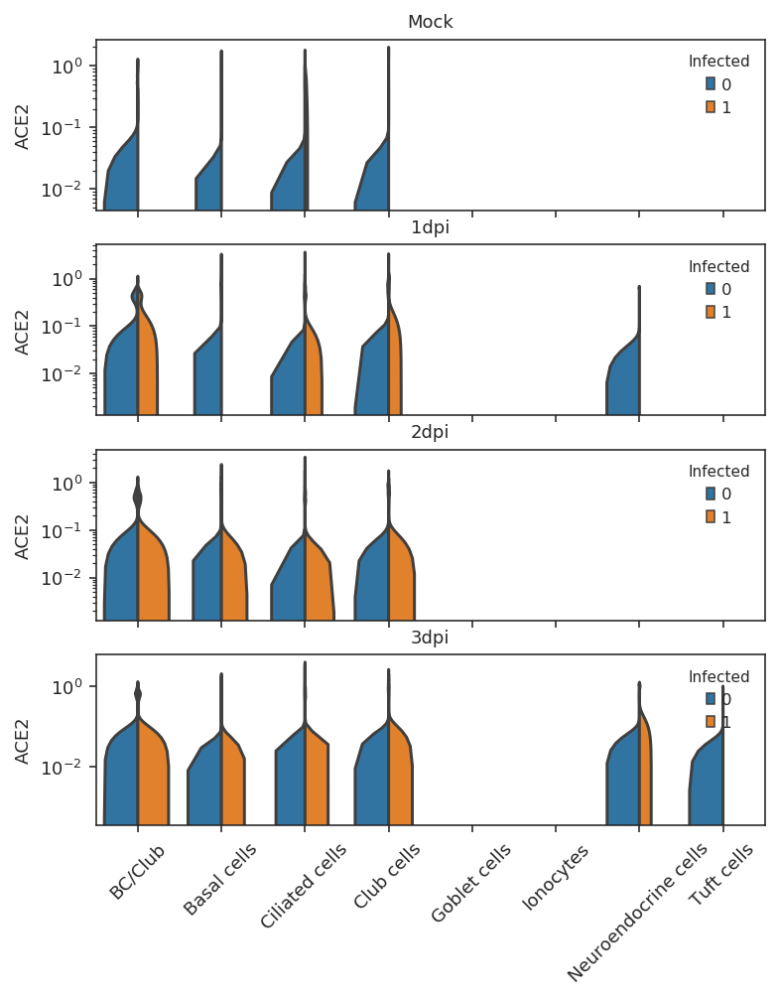

In [35]:
fig,ax = plt.subplots(4,1,figsize=(6,7))
j=0
for i,condition in enumerate(['Mock','1dpi','2dpi','3dpi']):
    x = X.loc[X['Condition']==condition,:]
    sns.violinplot(x='Cell type', y=g, hue="Infected",
                   split=True, inner="quart",
    #                palette={"Yes": '1', "No": "0"},
                   data=x, ax=ax[i])
#         ax1 = ax[i].twinx()
#         ax1.set_yticks([0.,1.])
#         ax[i].set_ylabel(ctype,rotation=0)
    if False:
        # set log scale
        ax[i].set_yscale('log')
    else:
        ax[i].set_ylim([0, X[g].max()])
    ax[i].set_yscale('log')
#     ax[i].set_yticks([])
    ax[i].set_title(condition)
#     ax[i].set_xlabel(ax[i].get_xticklabels(),rotation=90)
    if j==3:
#         chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
        ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation=45)
    else: 
        ax[i].set_xticklabels('',rotation=45)
    ax[i].set_xlabel('')
    j+=1
# #         ax[i].text(0.9,0.85,ctype,
# #             horizontalalignment='center',
# #             verticalalignment='center',
# #             transform = ax[i].transAxes)
# #     #     ax1.set_ylabel(g)
# #         if j==0:
# #             ax.set_ylabel(t)
#         else:
#             ax.set_ylabel('')
#         if True :
#             # highlight differences across time
#             ax1.set_yticks([]) 
# #         if t=='30wk':
# #             ax.set_xticks([0,0.25,0.50,0.75,1])
# #         else:
# #             ax.set_xticks([])
#         ax.set_xticks([])
#         ax.set_xlim([x_min,x_max])
#         if t=='5wk':
#             x = np.min(p1.get_xbound()+p2.get_xbound())
#             y = np.max(p1.get_ybound()+p2.get_ybound())

# fig.subplots_adjust(wspace=0, hspace=0)

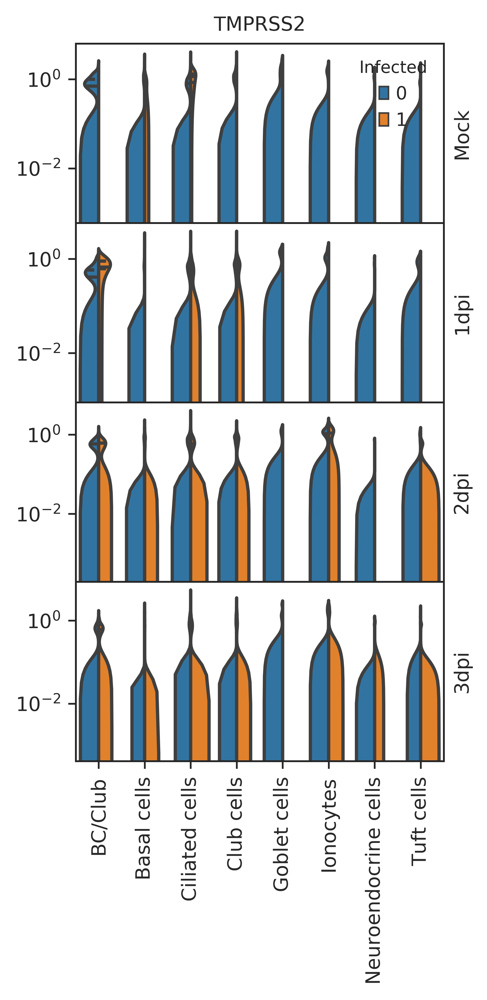

In [102]:
g = 'TMPRSS2'
X = pd.DataFrame({g:adata[:,g].X,
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype']})
fig,ax = plt.subplots(4,1,figsize=(3,6))

j=0
for i,condition in enumerate(['Mock','1dpi','2dpi','3dpi']):
    x = X.loc[X['Condition']==condition,:]
    sns.violinplot(x='Cell type', y=g, hue="Infected",
                   split=True, inner="quart",
    #                palette={"Yes": '1', "No": "0"},
                   data=x, ax=ax[i])
    ax1 = ax[i].twinx()
    ax1.set_yticks([])
    ax1.set_ylabel(condition)
    ax[i].set_ylabel('')
    if True:
        # set log scale
        ax[i].set_yscale('log')
    else:
        ax[i].set_ylim([0, X[g].max()])
    if j==3:
        ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation=90)
    else: 
        ax[i].set_xticklabels('')
        ax[i].set_xticks([])

    if j!=0:
        ax[i].legend().set_visible(False)

    ax[i].set_xlabel('')

    if j==0:
        if False:
            ax[i].text(0,1,g,
                horizontalalignment='center',
                verticalalignment='center',
                transform = ax[i].transAxes)
        else:
            ax[i].set_title(g)
    j+=1
    
fig.subplots_adjust(hspace=0)

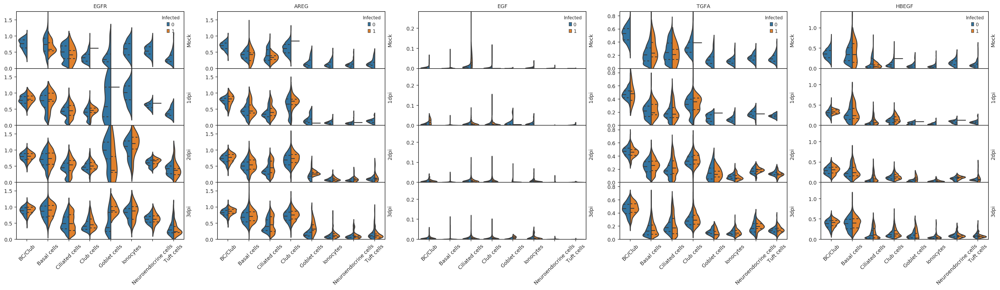

In [55]:
genes = [
    'EGFR',
    'AREG',
    'EGF',
    'TGFA',
    'HBEGF',
]
fig,axarr = plt.subplots(4,5,figsize=(30,7))
for i,g in enumerate(genes):
    X = pd.DataFrame({g:adata[:,g].layers['imputed_bbknn'],
                      'Condition':adata.obs['Condition'],
                      'Infected':adata.obs['scv2_5+'],
                      'Cell type':adata.obs['ctype']})
    
#     fig,ax = plt.subplots(4,1,figsize=(6,7))
    ax = axarr[:,i]
    j=0
    for i,condition in enumerate(['Mock','1dpi','2dpi','3dpi']):
        x = X.loc[X['Condition']==condition,:]
        sns.violinplot(x='Cell type', y=g, hue="Infected",
                       split=True, inner="quart",
        #                palette={"Yes": '1', "No": "0"},
                       data=x, ax=ax[i])
        ax1 = ax[i].twinx()
        ax1.set_yticks([])
        ax1.set_ylabel(condition)
        ax[i].set_ylabel('')
        if False:
            # set log scale
            ax[i].set_yscale('log')
        else:
            ax[i].set_ylim([0, X[g].max()])
        if j==3:
            ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation=45)
        else: 
            ax[i].set_xticklabels('',rotation=45)
            ax[i].set_xticks([])
            
        if j!=0:
            ax[i].legend().set_visible(False)
            
        ax[i].set_xlabel('')
        
        if j==0:
            if False:
                ax[i].text(0,1,g,
                    horizontalalignment='center',
                    verticalalignment='center',
                    transform = ax[i].transAxes)
            else:
                ax[i].set_title(g)
        j+=1


# fig.subplots_adjust(wspace=0, hspace=0)
fig.subplots_adjust(hspace=0)
    
if True:
    fig.savefig(os.path.join(pfp,'dist_EGFR.png'),dpi=600,bbox_inches='tight')

In [75]:
for i,g in enumerate(genes):
    ax = gs[i]
    plt.show()

In [89]:
genes = [
    'TAP1',
    'TAP2',
    'TAPBP',
    'ERAP1',
    'ERAP2',
    'HLA-A',
    'HLA-B',
    'HLA-C',
#     'HLA-D',
    'HLA-E',
#     'HLA-F',
    'HLA-G',
#     'HLA-H',
    'B2M',
    'MICA',
    'MICB',
    'CALR',
    'CANX',
    'PDIA3',
]

fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(4, 4, figure = fig, hspace=0.1)


for i,g in enumerate(genes):
    X = pd.DataFrame({g:adata[:,g].layers['imputed_bbknn'],
                      'Condition':adata.obs['Condition'],
                      'Infected':adata.obs['scv2_5+'],
                      'Cell type':adata.obs['ctype']})
    
    inner_grid = gridspec.GridSpecFromSubplotSpec(4,1,
                                                  hspace=0,
                                                  subplot_spec=gs[i])
    
    j=0
    for k,condition in enumerate(['Mock','1dpi','2dpi','3dpi']):
        ax = fig.add_subplot(inner_grid[k])
        x = X.loc[X['Condition']==condition,:]
        sns.violinplot(x='Cell type', y=g, hue="Infected",
                       split=True, inner="quart",
        #                palette={"Yes": '1', "No": "0"},
                       data=x, ax=ax)
        ax1 = ax.twinx()
        ax1.set_yticks([])
        ax1.set_ylabel(condition)
        ax.set_ylabel('')
        if False:
            # set log scale
            ax.set_yscale('log')
        else:
            ax.set_ylim([0, X[g].max()])
        if j==3 and i>11:
            ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
        else: 
            ax.set_xticklabels('',rotation=45)
            ax.set_xticks([])
            
        if j!=0:
            ax.legend().set_visible(False)
            
        ax.set_xlabel('')
        
        if j==0:
            if False:
                ax.text(0,1,g,
                    horizontalalignment='center',
                    verticalalignment='center',
                    transform = ax.transAxes)
            else:
                ax.set_title(g)
        j+=1


# fig.subplots_adjust(wspace=0, hspace=0)
fig.subplots_adjust(hspace=0)
    
if True:
    fig.savefig(os.path.join(pfp,'dist_AP.pdf'),dpi=600,bbox_inches='tight')

In [88]:
x = [i for i in adata.var_names if 'HLA-' in i]
x = [i for i in x if i[4] not in ['A','B','C','E','G']]
genes = x

fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(4, 4, figure = fig, hspace=0.1)


for i,g in enumerate(genes):
    X = pd.DataFrame({g:adata[:,g].layers['imputed_bbknn'],
                      'Condition':adata.obs['Condition'],
                      'Infected':adata.obs['scv2_5+'],
                      'Cell type':adata.obs['ctype']})
    
    inner_grid = gridspec.GridSpecFromSubplotSpec(4,1,
                                                  hspace=0,
                                                  subplot_spec=gs[i])
    
    j=0
    for k,condition in enumerate(['Mock','1dpi','2dpi','3dpi']):
        ax = fig.add_subplot(inner_grid[k])
        x = X.loc[X['Condition']==condition,:]
        sns.violinplot(x='Cell type', y=g, hue="Infected",
                       split=True, inner="quart",
        #                palette={"Yes": '1', "No": "0"},
                       data=x, ax=ax)
        ax1 = ax.twinx()
        ax1.set_yticks([])
        ax1.set_ylabel(condition)
        ax.set_ylabel('')
        if False:
            # set log scale
            ax.set_yscale('log')
        else:
            ax.set_ylim([0, X[g].max()])
        if j==3 and i>11:
            ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
        else: 
            ax.set_xticklabels('',rotation=45)
            ax.set_xticks([])
            
        if j!=0:
            ax.legend().set_visible(False)
            
        ax.set_xlabel('')
        
        if j==0:
            if False:
                ax.text(0,1,g,
                    horizontalalignment='center',
                    verticalalignment='center',
                    transform = ax.transAxes)
            else:
                ax.set_title(g)
        j+=1


# fig.subplots_adjust(wspace=0, hspace=0)
fig.subplots_adjust(hspace=0)
    
if True:
    fig.savefig(os.path.join(pfp,'dist_MHCII.pdf'),dpi=600,bbox_inches='tight')

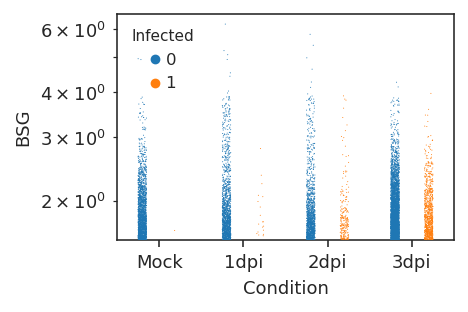

In [75]:
g = 'BSG'
X = pd.DataFrame({g:adata[:,g].X,
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype']})

fig, ax = plt.subplots(1,1,figsize=(3,2))
sns.stripplot(x='Condition', y=g, hue='Infected', 
              data=X, order=['Mock','1dpi','2dpi','3dpi'], 
              hue_order=None, 
              jitter=True, dodge=True, orient=None, color=None, palette=None, 
              size=0.5, edgecolor='gray', linewidth=0, ax=ax)
ax.set_yscale('log')

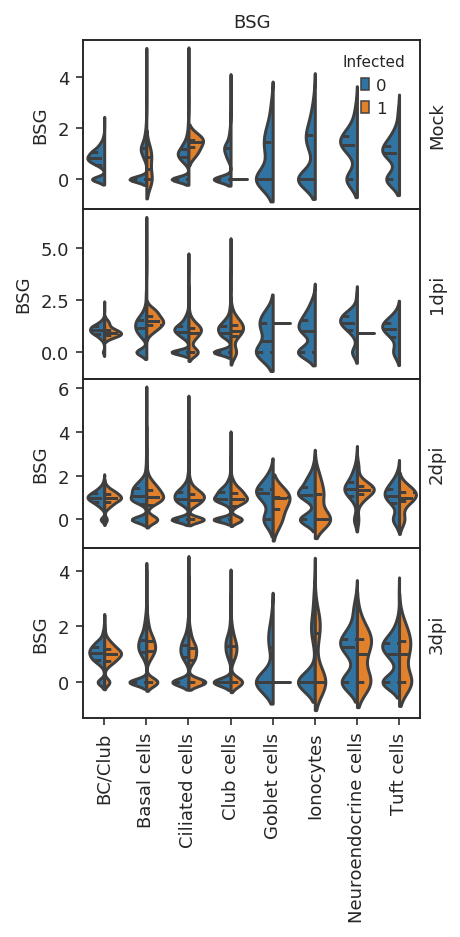

In [98]:
g = 'BSG'
X = pd.DataFrame({g:adata[:,g].X,
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype']})


fig, ax = plt.subplots(4,1,figsize=(3,6))
for i,condition in enumerate(['Mock','1dpi','2dpi','3dpi']):
    x = X.loc[X['Condition']==condition,:]
    sns.violinplot(x='Cell type', y=g, hue="Infected",
                   split=True, inner="quart",
                   data=x, ax=ax[i])
    if i==0:
        ax[i].set_title(g)
    else:
        ax[i].legend().set_visible(False)
    if i==3:
        ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation=90)
    else:
        ax[i].set_xticks([])
    ax1 = ax[i].twinx()
    ax1.set_yticks([])
    ax1.set_ylabel(condition)
    ax[i].set_xlabel('')
    
fig.subplots_adjust(hspace=0)


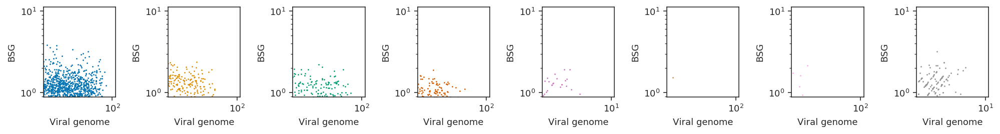

In [90]:
g = 'BSG'
X = pd.DataFrame({g:adata[:,g].X,
                  'Viral genome':adata[:,'scv2_orf1-10'].X,
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype']})

fig,ax=plt.subplots(1,8,figsize=(14,2))
for i,ctype in enumerate(X['Cell type'].unique()):
    x = X.loc[X['Cell type']==ctype,:]
    
    sns.scatterplot(x='Viral genome', y=g, data=x,
                    linewidth=0, color=sns.color_palette('colorblind',8)[i],
                    ax=ax[i], s=2)
    
    ax[i].set_yscale('log')
    ax[i].set_xscale('log')
    
    
fig.tight_layout()

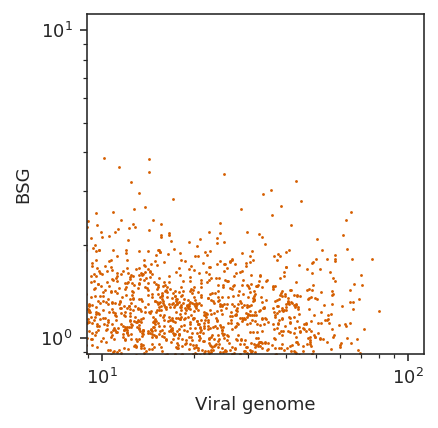

In [93]:
g = 'BSG'
X = pd.DataFrame({g:adata[:,g].X,
                  'Viral genome':adata[:,'scv2_orf1-10'].X,
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype']})

fig,ax=plt.subplots(1,1,figsize=(3,3))

sns.scatterplot(x='Viral genome', y=g, data=X,
                linewidth=0, color=sns.color_palette('colorblind',8)[3],
                ax=ax, s=2)

ax.set_yscale('log')
ax.set_xscale('log')

    


In [100]:
adata.obs['res_t'] = adata.obs['Condition'].astype(str)
adata.obs['res_t'][adata.obs['Condition']=='Mock']=0
adata.obs['res_t'][adata.obs['Condition']=='1dpi']=1
adata.obs['res_t'][adata.obs['Condition']=='2dpi']=2
adata.obs['res_t'][adata.obs['Condition']=='3dpi']=3

In [104]:
adata.obs['res_t'].to_numpy(dtype=float)

array([0., 0., 0., ..., 3., 3., 3.])

In [105]:
G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),
                 precomputed='adjacency',
                 use_pygsp=True)
G.knn_max = None
adata.obs['ees_t']=meld.MELD().fit_transform(G=G,RES=adata.obs['res_t'].to_numpy(dtype=float))
adata.obs['ees_t']=adata.obs['ees_t']-adata.obs['ees_t'].mean() # mean center

In [121]:
pt_color = (x['Viral genome'] - x['Viral genome'].min()) / (x['Viral genome'].max() - x['Viral genome'].min())
pt_color

index
AAACCCACAAGCCATT-1-MOCK_HBEC_HCR     0.000000
AAACCCACATGACTTG-1-MOCK_HBEC_HCR     0.000000
AAACCCAGTCAGTCGC-1-MOCK_HBEC_HCR     0.000000
AAACCCAGTCGTCTCT-1-MOCK_HBEC_HCR     0.000000
AAACCCAGTTGCTAGT-1-MOCK_HBEC_HCR     0.000000
                                       ...   
TTTGTTGAGGAACATT-1-3dpi_CoV2_orf1    0.021786
TTTGTTGAGTGCAAAT-1-3dpi_CoV2_orf1    0.029995
TTTGTTGGTAATGATG-1-3dpi_CoV2_orf1    0.027016
TTTGTTGGTCTAACGT-1-3dpi_CoV2_orf1    0.080379
TTTGTTGTCGGTCGGT-1-3dpi_CoV2_orf1    0.026110
Name: Viral genome, Length: 25383, dtype: float32

In [125]:
pt_color.max()

1.0

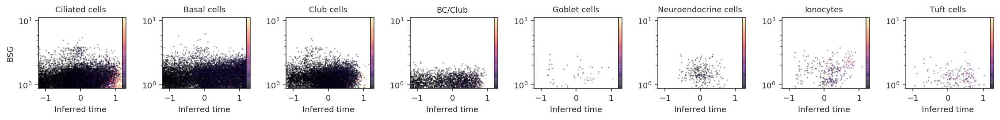

In [148]:
g = 'BSG'
X = pd.DataFrame({g:adata[:,g].X,
                  'Viral genome':adata[:,'scv2_orf1-10'].X,
                  'Condition':adata.obs['Condition'],
                  'Infected':adata.obs['scv2_5+'],
                  'Cell type':adata.obs['ctype'],
                  'Inferred time':adata.obs['ees_t']})

fig,ax=plt.subplots(1,8,figsize=(16,2))
for i,ctype in enumerate(X['Cell type'].unique()):
    x = X.loc[X['Cell type']==ctype,:]
    pt_color = (x['Viral genome'] - x['Viral genome'].min()) / (x['Viral genome'].max() - x['Viral genome'].min())
    
    im=ax[i].scatter(x=x['Inferred time'], y=x[g], cmap='magma',
                     c=pt_color.to_numpy(), s=0.3, alpha = 0.4,
                     vmax=0.5)
    cbar = fig.colorbar(im, pad=0, ax=ax[i],
                        ticks = [])
    
    
    
    ax[i].set_yscale('log')
    ax[i].set_title(ctype)
    ax[i].set_xlabel('Inferred time')
    ax[i].set_xlim([-1.2,1.2])
    if i==0:
        ax[i].set_ylabel(g)

    
    
fig.tight_layout()

In [149]:
cmap_ctype = {v:sns.color_palette('colorblind',8)[i] for i,v in enumerate(adata.obs['ctype'].unique())}

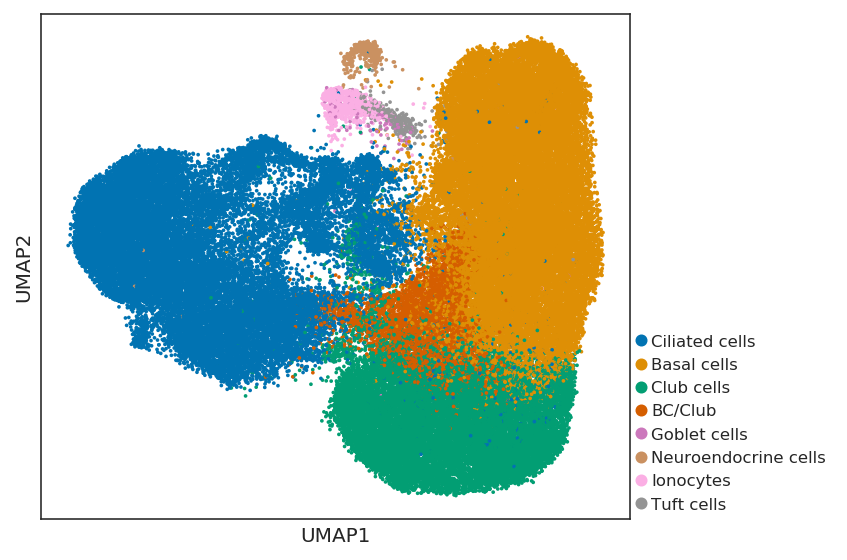

In [150]:
scprep.plot.scatter2d(adata.obsm['X_umap'],
                      c=adata.obs['ctype'],
                      cmap=cmap_ctype,
                      ticks=None,
                      legend_loc=(1,0),
                      label_prefix='UMAP')